# Treinando o Detectron2 com Guepardos

This tutorial implements the new [Detectron2 Library](https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/) by facebook. This notebook shows training on **your own custom objects** for object detection.

It is worth noting that the Detectron2 library goes far beyond object detection, supporting semantic segmentation, keypoint detection, mask, and densepose.

### Passo a passo

A seguir, um resumo do passo a passo realizado para obter o reconhecimento via rede neural dos guepardos em visão noturna.

•	Instalação das dependências do Detectron2
•	Download dos dados personalizados de detecção de objetos do Detectron2
•	Visualização dos dados de treinamento
•	Escrita da configuração personalizada de treinamento do Detectron2
•	Execução do treinamento
•	Avaliação da performance do Detectron2
•	Execução da inferência do Detectron2 em imagens de teste



# Instalando Dependências do Detectron

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-n993mnjt
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-n993mnjt
1.5.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


In [3]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Importar e registrar dados customizados

In [4]:
!curl -L "https://public.roboflow.com/ds/itJccgAG8A?key=hkVDxE5A76" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0   1850      0 --:--:-- --:--:-- --:--:--  1846
100 3885k  100 3885k    0     0  1341k      0  0:00:02  0:00:02 --:--:-- 3216k
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/IMG_0028_jpeg.rf.514f114438ecc7b4598469edfa2ab9d5.jpg  
 extracting: test/IMG_0040_jpeg.rf.6b861f9901f1e6ca029059ea643656cf.jpg  
 extracting: test/PIR-206_0_mov-10_jpg.rf.d2a3a92c4285b8d8015e935a91de3522.jpg  
 extracting: test/PIR-206_0_mov-1_jpg.rf.e64b2e22cacf10f49ec0c48bbb526469.jpg  
 extracting: test/PIR-206_13_mov-7_jpg.rf.efba5353c047a4932a62308fc282cb47.jpg  
 extracting: test/PIR-206_13_mov-8_jpg.rf.a06824ec551e5ae8452de267a5dcabf9.jpg  
 extracting: test/PIR-206_13_mov-9_jpg.rf.0d325a875aa2d4a38c668a692e426aff.jpg  
 extracting: test/PIR-206_19_mov-10_jpg.rf.53ce736ae

In [5]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [11/17 01:57:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/17 01:57:39 d2.data.datasets.coco]: Loaded 90 images in COCO format from /content/train/_annotations.coco.json


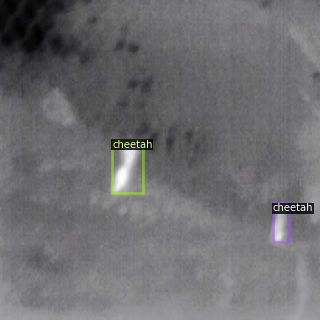

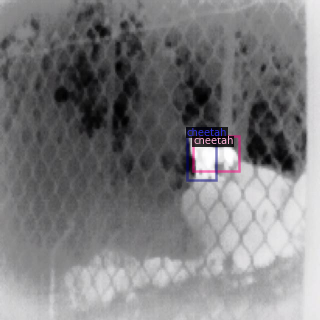

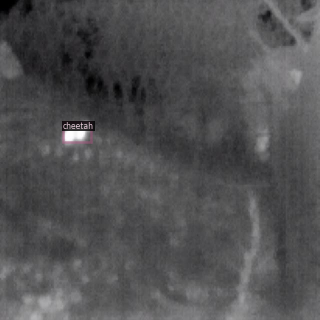

In [6]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Treinando o Detectron2

In [7]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [8]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[11/17 01:58:31 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:23, 18.3MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[11/17 01:58:59 d2.engine.train_loop]: Starting training from iteration 0
[11/17 01:59:34 d2.utils.events]:  eta: 0:45:43  iter: 19  total_loss: 2.385  loss_cls: 1.602  loss_box_reg: 0.648  loss_rpn_cls: 0.095  loss_rpn_loc: 0.011  time: 1.7882  data_time: 0.0334  lr: 0.000020  max_mem: 7229M
[11/17 02:00:10 d2.utils.events]:  eta: 0:44:44  iter: 39  total_loss: 1.965  loss_cls: 1.143  loss_box_reg: 0.762  loss_rpn_cls: 0.071  loss_rpn_loc: 0.009  time: 1.8069  data_time: 0.0151  lr: 0.000040  max_mem: 7229M
[11/17 02:00:48 d2.utils.events]:  eta: 0:44:29  iter: 59  total_loss: 1.636  loss_cls: 0.711  loss_box_reg: 0.893  loss_rpn_cls: 0.017  loss_rpn_loc: 0.008  time: 1.8301  data_time: 0.0125  lr: 0.000060  max_mem: 7229M
[11/17 02:01:25 d2.utils.events]:  eta: 0:43:47  iter: 79  total_loss: 1.446  loss_cls: 0.513  loss_box_reg: 0.905  loss_rpn_cls: 0.007  loss_rpn_loc: 0.006  time: 1.8315  data_time: 0.0133  lr: 0.000080  max_mem: 7229M
[11/17 02:02:03 d2.utils.events]:  eta: 0:43:3

In [10]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1174), started 0:01:36 ago. (Use '!kill 1174' to kill it.)

<IPython.core.display.Javascript object>

In [11]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [11/17 02:54:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/17 02:54:45 d2.data.datasets.coco]: Loaded 14 images in COCO format from /content/test/_annotations.coco.json
[11/17 02:54:45 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  cheetah   | 0            |  cheetah   | 23           |   human    | 8            |
|            |              |            |              |            |              |
|   total    | 31           |            |              |            |              |
[11/17 02:54:45 d2.data.common]: Serializing 14 elements to byte tensors and concatenating them all ...
[11/17 02:54:45 d2.data.common]: Serialized dataset takes 0.00 MiB
[11/17 02:54:45 d2.evaluation.evaluator]: Start inference on 14 i

OrderedDict([('bbox',
              {'AP': 56.99079364458186,
               'AP50': 77.50753336203186,
               'AP75': 57.60654326302196,
               'APs': 38.63861386138614,
               'APm': 51.48554855485548,
               'APl': 93.84158415841584,
               'AP-cheetah': 81.44693382381718,
               'AP-human': 32.53465346534654})])

# Inferências



In [12]:
%ls ./output/

coco_instances_results.json                        last_checkpoint
events.out.tfevents.1668650315.1de43ab295fd.305.0  metrics.json
instances_predictions.pth                          model_final.pth


In [13]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

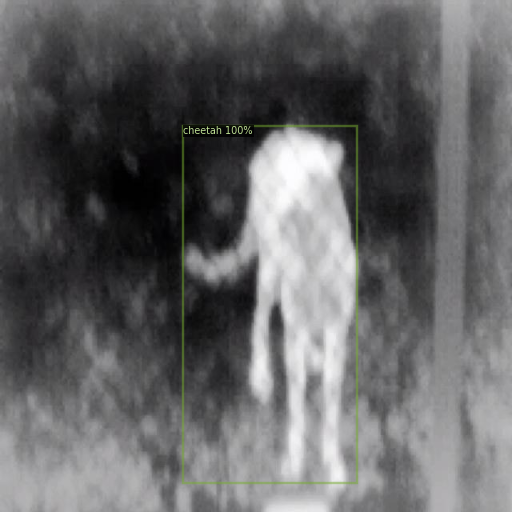

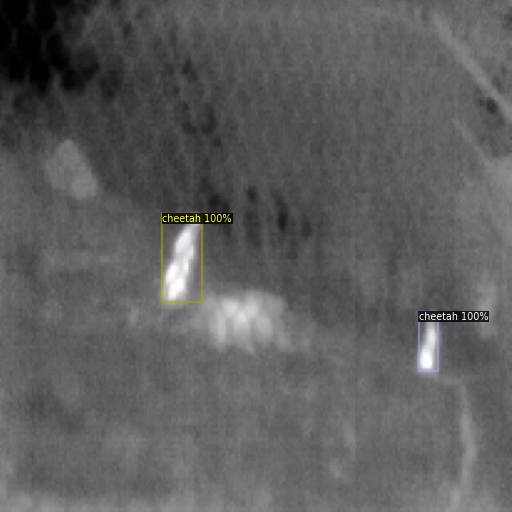

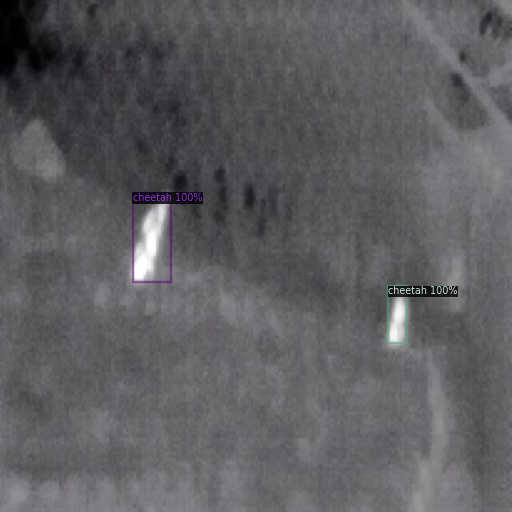

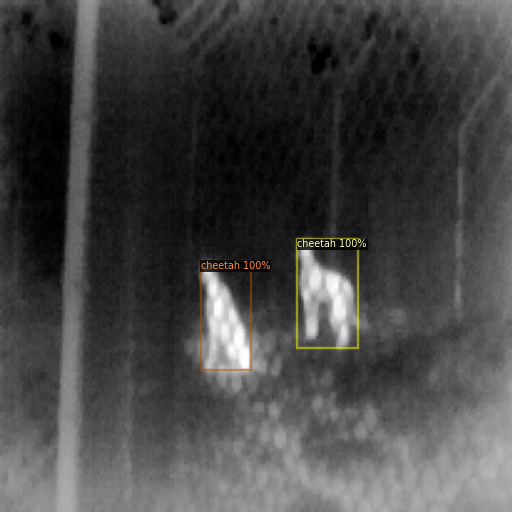

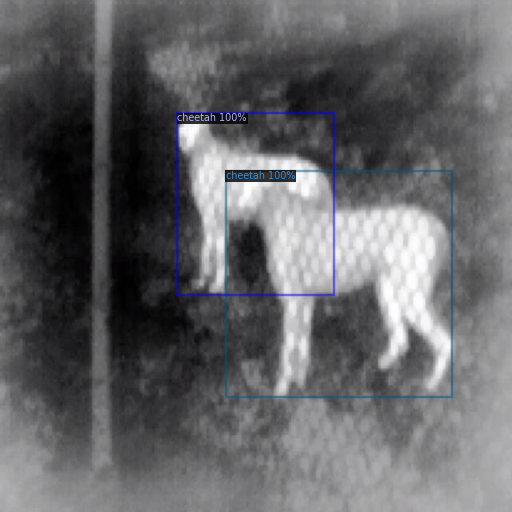

...

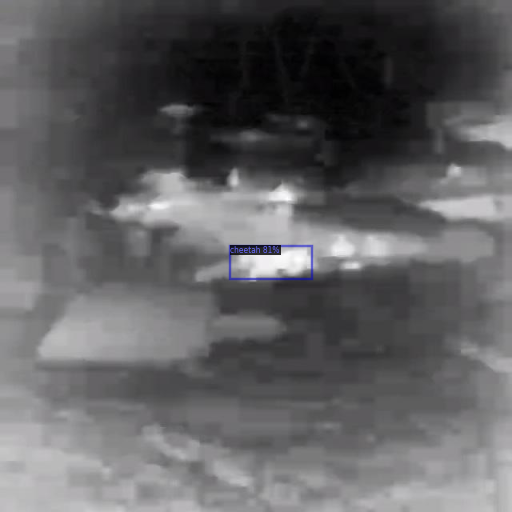

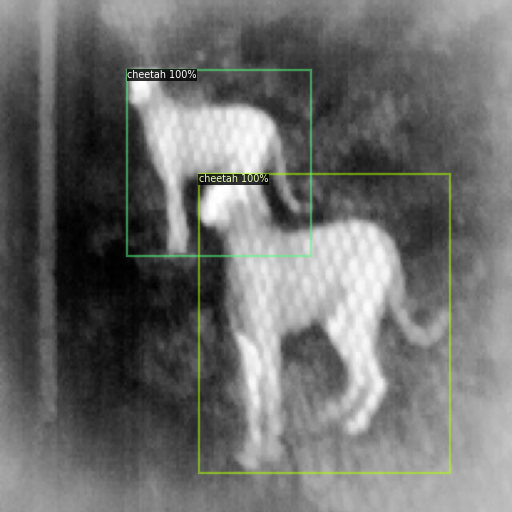

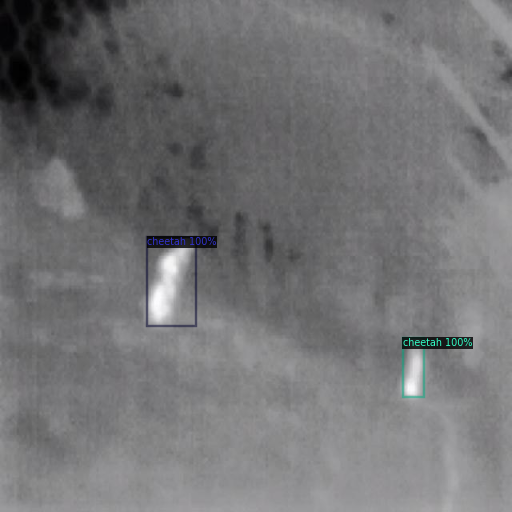

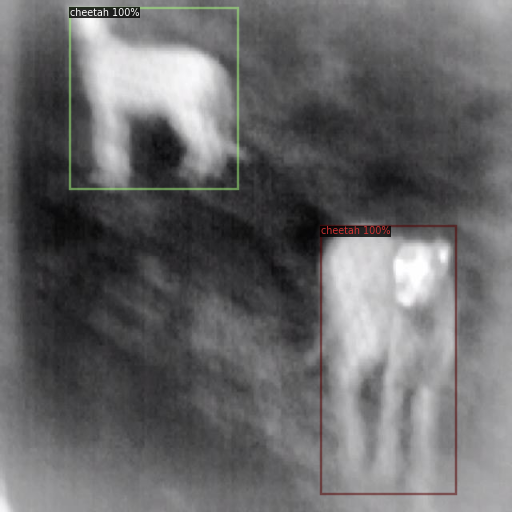

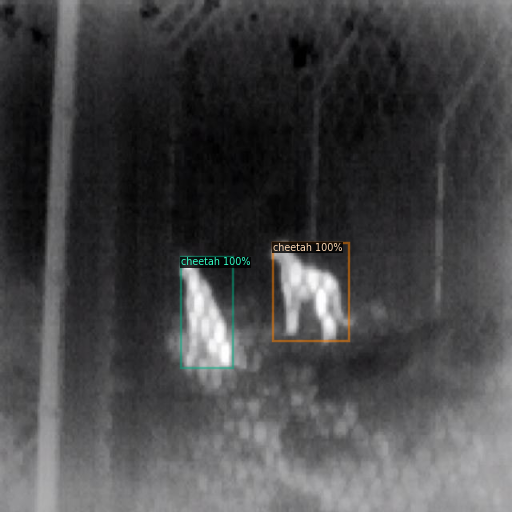

In [14]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
